In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt   
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
data=pd.read_spss("FTT.sav")  
data.shape
data=data[["gender","education","groups","GDS","ApoE4","AB42","TAU_T","P_TAU","FTT_rate","FTT_variability_total_Log10","AL","AT","RD","RDT","BNT","ANIMALES","VOSP_NUM","TMT_A","TMT_B","STROOP_LECT","STROOP_COLOR","STROOP_INT","SDMT","HIPERTENSIÓN","DIABETES","IMC","activ_ocio_cogn","activ_ocio_soc","activ_ocio_fisica","INFARTO_MIOCARDIO","ACCIDENTE_VASCULAR_CEREBRAL"]]      

In [3]:
data.head()

,gender,education,groups,GDS,ApoE4,AB42,TAU_T,P_TAU,FTT_rate,FTT_variability_total_Log10,...,STROOP_INT,SDMT,HIPERTENSIÓN,DIABETES,IMC,activ_ocio_cogn,activ_ocio_soc,activ_ocio_fisica,INFARTO_MIOCARDIO,ACCIDENTE_VASCULAR_CEREBRAL
0,male,18.0,grupo control,GDS2,CN individuals ApoE4 noncarriers,772.0,161.5,40.0,343.0,-0.772488,...,65.0,54.0,1.0,0.0,26.0,116.0,56.0,54.0,0.0,0.0
1,male,10.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,860.0,288.5,62.0,361.0,-0.961703,...,46.0,79.0,1.0,0.0,29.0,119.0,61.0,69.0,0.0,0.0
2,female,9.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,730.0,429.0,70.0,320.0,-0.619379,...,43.0,26.0,1.0,0.0,25.0,91.0,43.0,35.0,0.0,0.0
3,female,15.0,grupo control,GDS2,CN individuals ApoE4 noncarriers,716.0,247.0,62.9,361.0,-0.998009,...,43.0,65.0,1.0,0.0,22.0,169.0,73.0,75.0,0.0,0.0
4,male,8.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,697.0,252.0,62.5,329.0,-0.697174,...,54.0,29.0,0.0,0.0,28.0,160.0,76.0,97.0,0.0,0.0


## 1. Variable definitions

The Database contains 72 samples and 51 variables, below we have provided a definition of each individual variable along with its grouping of variable category.

**Variable Definition**
- **ID**
    - num_lab: subject ID 
- **Demographics**
   - gender: male, or female
   - education: years of education
- **Groupings**
   - groups: 1) grupo control - no signs of Alzheimer's disease (negative Alzheimer's disease) biomarkers; 2) grupo preclinico - early onset Alzheimer's disease; 3) Al grupo con EA - Alzheimer's disease patients.   
   - GDS: Global Deterioration Scale score
- **Biomarkers**   
   - ApoE4: Apoe4 carriers, ApoE4 noncarriers.
   - AB42: CSF Amyloid-B isoform 42 levels
   - TAU_T: CSF total tau levels
   - P_TAU: CSF phosphorylated tau levels
- **Finger tapping tests**
   - FTT_rate: finger tapping test rate (tapping rate performance)
   - FTT_variability_total_Log10: finger tapping test variability [logarithmic transformation (log10) applied]
- **Battery tests**
   - AL: Free and Cued Selective Reminding Test - Free learning score
   - AT: Free and Cued Selective Reminding Test - Total learning score
   - RD: Free and Cued Selective Reminding Test - Delayed free recall score
   - RDT: Free and Cued Selective Reminding Test - Delayed total recall score
   - BNT: Boston Naming Test score
   - ANIMALES: category fluency task - animals in one minute
   - VOSP_NUM: Visual Object and Space Perception battery - number location subtest
   - TMT_A: Trail Making Test - Form A
   - TMT_B: Trail Making Test - Form B
   - STROOP_LECT: Stroop test - word reading subtest
   - STROOP_COLOR: Stroop test - color reading subtest
   - STROOP_INT: Stroop test - word-color reading subtest
   - SDMT: Symbol Digit Modalities Test score
- **Well-being tests**
   - HIPERTENSIÓN: hypertensive subject? 0, no; 1, yes 
   - DIABETES: diabetic subject? 0, no; 1, yes
   - IMC: body-mass index
   - activ_ocio_cogn: leisure activities questionnaire (cognitive sub-score)
   - activ_ocio_soc: leisure activities questionnaire (social sub-score)
   - activ_ocio_fisica: leisure activities questionnaire (physical sub-score)
- **Medical history**
   - INFARTO_MIOCARDIO: has the subject suffered from a myocardial infarction? 0, no; 1, yes
   - ACCIDENTE_VASCULAR_CEREBRAL: has the subject suffered a stroke? 0, no; 1, yes

In [4]:
import pandas_profiling as pp
pp.ProfileReport(data)

## 2. Duplicate Samples
Duplicate samples are an extreme case of nonrandom sampling, and they can bias a fitted model. Including them will essentially lead to the model overfitting the subset of points and hence if present in the data should be removed. 

We checked for duplicate rows in the dataset and as shown in the output of the *ProfileReport*, there are no duplicate values. Each sample represents a patient and have individual ID's denoted by the variable *num_lab*, which has 72 distinct values which is the size of the data set confirming that we do not have any duplicate values. 

## 3. Missing Values
From the above we find that there are several variables with missing values. Handling missing data is important as many machine learning algorithms do not support data with missing values.

It is key to understand the reason for the missing variables in order to decide how to handle them. In addition the percentage of missing values each variable has is important to determine whether the percentage is low enough to handle or too high to handle in which case the variable would be excluded from the model. 

We investigated these two aforementioned points and confirmed with the clinicians that supplied the data. Below is the result:

- **ID**, **Demographics** and **Groupings** have no missing values.
- **Biomarkers** have one missing variable, **ApoE4**. It is missing by error thus at random. To impute this value we will use knn nearest neighbours and since the variable can only take one of two values, that is, *Apoe4 carriers* or *ApoE4 noncarriers*, we take the most frequent value of the nearest neighbours. 
* **Battery test**, **Well-being tests: 15** and **Medical history** all have missing values that do not occur by random. They are missing for the group *grupo con EA*, which represents patients with Alzheimer's disease. These patients were not given the battery tests. We therefore need to note that we can not do any classification with this group using the variables that are missing. However since this classification is not our primary objective we will still analyze these variables, but separately for only the groups that have values present.
* **IMC** (body mass index), it is missing for 50% of the dataset. With this large proportion of missing values we decided to remove it from our analysis.
* **activ_ocio_soc** and **activ_ocio_fisica** have 34% (15) missing values at random, this is because some patients didn't complete the survey. We will discard these variables from our analysis since they have more than 30% missing values which is our threshold. Further the clinicians confirmed that the variables are not significant from their medical point of view. 
* **INFARTO_MIOCARDIO** and **ACCIDENTE_VASCULAR_CEREBRAL** all have the value of zero, hence they would not add value to our analysis and thus we will discard them from the analysis. 
 


In [4]:
# Removing some variables as per the above mentioned motivations
data=data.drop(["IMC","activ_ocio_cogn","activ_ocio_soc","activ_ocio_fisica","INFARTO_MIOCARDIO","ACCIDENTE_VASCULAR_CEREBRAL"],axis=1)

# Data Grouping
#As we discovered, there are variables that are not available for the patients with Alzheimer's disease (Battery and Well-being tests)
#We will therefore remove these variables and analyze them separately later for patients with onset Alzheimer's disease and control.

data=data.drop(["AL","AT","RD","RDT","BNT","ANIMALES","VOSP_NUM","TMT_A","TMT_B","STROOP_LECT","STROOP_COLOR","STROOP_INT","SDMT","HIPERTENSIÓN","DIABETES"],axis=1)

In [5]:
data.head()

,gender,education,groups,GDS,ApoE4,AB42,TAU_T,P_TAU,FTT_rate,FTT_variability_total_Log10
0,male,18.0,grupo control,GDS2,CN individuals ApoE4 noncarriers,772.0,161.5,40.0,343.0,-0.772488
1,male,10.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,860.0,288.5,62.0,361.0,-0.961703
2,female,9.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,730.0,429.0,70.0,320.0,-0.619379
3,female,15.0,grupo control,GDS2,CN individuals ApoE4 noncarriers,716.0,247.0,62.9,361.0,-0.998009
4,male,8.0,grupo control,GDS1,CN individuals ApoE4 noncarriers,697.0,252.0,62.5,329.0,-0.697174


In [22]:
#We repeat the profiling reprort for this smaller dataset
pp.ProfileReport(data)


## 4. Distribution of the variables

- **num_lab**: All are unique values so no pattern is present
- **gender**: 47 (65%) of the samples/patients are female while 25 (35%) are male 
- **education**: The minimum number of years of education is 1 and the maximum is 20. There are some peaks in the distribution with 8 years being the highest, representing the most common education cycle. 
- **groups**: 37 are in control(no cognitive problems and normal biomarker values), 30 have onset Alzheimer's disease (no cognitive problems and not normal biomarker values) and 15 patients with Alzheimer's disease.
- **GDS**: There are 4 groups of the Global Deterioration Scale, with 28 and 29 in the GDS1 and GDS2 respectively. The samples with these values are control or with onset Alzheimer's disease. While GDS3 and GDS4 have 6 and 9 respectively and belong to people with Alzheimer's disease. 
- **ApoE4**: There are two categories in this group, either a person is a carrier of the gene which increases the likelihood of developing Alzheimer's disease (20 samples/patients), or not a carrier (51 samples/patients)
- **AB42**: There is a large standard deviation (255) in the Amyloid beta values of individuals, with the lowest value being 163.5 and the highest 1187.5. There is no distinct pattern, however we see a larger number at the lower end of the scale. All values are distinct.
- **TAU_T**: Similar to the amyloid beta values, there is a high standard deviation at 203 with the lowest values being 83.5 and the largest 1,200. The distribution is skewed to the right. All values are distinct
- **P_TAU**: Is slightly skewed to the right, with a smaller standard deviation compared to total tau of 25.5. The maximum value is 124 and the minimum 24. 
- **FTT_rate**: The distribution is somewhat similar to the normal distribution with a mean of 325, a minimum value of 231 and maximum value of 434.
- **FTT_variability**: No clear distribution, however there seems to be outliers at each end of the scale. This is the only variable with negative values and this is because it is the log to the base 10 of the variability of the taps over several trials which are small values (<1) and hence are all negative values. The minimum is -1.08 and the maximum -0.098.


## 5. Interactions between variables
- **education**: There doesn't seem to be any interaction between *education* and any other variable.
- **AB42** and **TAU_T**: When the Amyloid beta values are low the values of total tau are high. This is because Amyloid beta clumps into plaques between neurons. As the level of Amyloid beta reaches a tipping point (low value), there is a rapid spread of tau throughout the brain. 
- **AB42** and **P_TAU**: Similar to total tau, when the Amyloid beta values are low, we see the highest values of phosphorylated tau. 
- **AB42** and **FTT_Rate**: There is an evident positive linear trend between the Amyloid beta values and the tapping rate. This is interesting since the values of Amyloid beta help segment the patients into their groups. Patients with high values of Amyloid Beta are usually patients in the *control* group and hence have no signs of Alzheimers and this interaction indicates that *control* patients have a higher tapping rate compared to patients with low values of Amyloid beta, who are showing signs of Alzheimer's disease having lower tapping rates. 
- **AB42** and **FTT_variability**: There is a negative trend between the Amyloid beta values and the log of the tapping variability. Again this is interesting as it suggests that people with signs of Alzheimers disease have a higher variability in the tapping rate throughout the trials. 
- **TAU_T** and **P_TAU**: There is a very clear positive trend between the total tau and the phosphorylated tau. This is exactly since phosphorylated tau is a type of tau which forms a piece of the total tau. 
- **TAU_T** and **FTT_rate**: There is a negative trend between the total tau and the tapping rate, indicating that patients with large total tau values have lower tapping rate and consequently patients with low values of total tau are more likely to have higher tapping rates.
- **TAU_T** and **FTT_variability**: There is a slight positive trend between the total tau values and the tapping variability, suggesting that people with high total tau have a higher variability in their tapping throughout the trials which patients with a lower total tau have more consistency in their tapping. 
- **P_TAU** and **FTT_rate**: Similar to total tau, there is a negative trend between phosphorylated tau and the tapping rate, indicating that patients with large phosphorylated tau values have lower tapping rate and consequently patients with low values of phosphorylated tau are more likely to have higher tapping rates.
- **P_TAU** and **FTT_variability**: The positive trend we saw with total tau is not clear with the phosphorylated tau .


## 6. Correlations
- **education**: There doesn't seem to be any correlation between *education* and any other variable in the data set. 
- **AB42**: Amyloid beta has a correlation between all of the variables (except *education*). The strongest correlation is found between the tapping data with a positive correlation for the tapping rate and a negative correlation with the tapping variability. 
- **TAU_T**: As expected the strongest correlation for the total tau is found with the phosphorylated tau. The second most correlated variable is found negatively with the tapping rate while tapping variability they is a weaker positive correlation.
- **P_TAU**: Similar to total tau, phosphorylated tau has a negative correlation with the tapping rate and a positive correlation with the tapping variability, however at a weaker strength. 
- **FTT_rate** and **FTT_variability**: There is a negative trend between the tapping rate and the tapping variability, indicating the people with a higher tapping rate have less variability in their tapping across trials and consequently people with a low tapping rate have a higher variability. 



## 7. Checking for outliers
We check for outliers in the numeric variables of the dataset. There are not many outliers detected in this dataset, with just 7 detected, in the variables **TAU_T**(3), **P_TAU**(3) and **FTT_rate**(1).

In [8]:
data_outliers=data[["education","AB42","TAU_T","P_TAU","FTT_rate","FTT_variability_total_Log10"]]

Q1 = data_outliers.quantile(0.25)
Q3 = data_outliers.quantile(0.75)
IQR = Q3 - Q1
((data_outliers < (Q1 - 1.5 * IQR)) | (data_outliers > (Q3 + 1.5 * IQR))).sum()

education                      0
AB42                           0
TAU_T                          3
P_TAU                          3
FTT_rate                       1
FTT_variability_total_Log10    0
dtype: int64

## 8. Plots
Given the findings in the previous sections we decied to dive a little deeper through visualisation means. 

In [19]:
#First we change the names of the patient groups for visualisation purposes, where AD is Alzheimers disease.
mapping = {"grupo control": "Control", "grupo preclinico": "Preclinical", "grupo con EA":"AD"}
data=data.replace({'groups': mapping})

### 8.1 Number of patients per group
First we look at the number of patients per group to understand the distribution of the predictor. The bar chart shows that most patients are from the *Control* (healthy) group while the least number of patients are in the *AD* (Alzheimer's Disease) group. 
This indicates that we have an unbalanced dataset and is something that we need to consider and handle when running the classifier. 

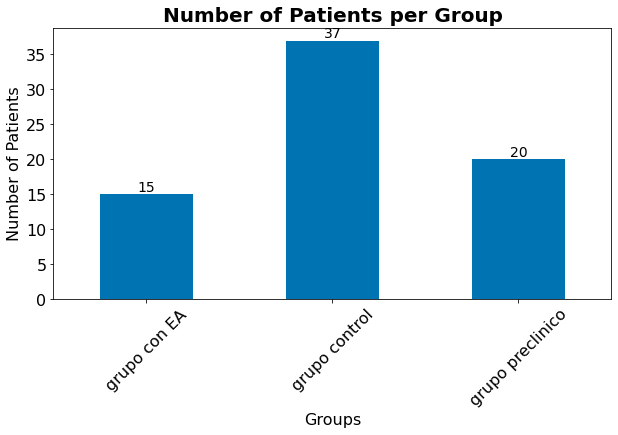

In [6]:
ax=data.groupby(
    data['groups']
)['groups'].count().plot(
    kind='bar',
    figsize=(10,5),
    color='#0073b2',
)
ax.set_ylabel("Number of Patients", size=16)
ax.set_xlabel("Groups", size=16)
ax.set_title('Number of Patients per Group',fontweight="bold", size=20)

ax.tick_params(axis = 'x', which = 'major', labelsize = 16,rotation=45)
ax.tick_params(axis = 'y', which = 'major', labelsize = 16)



# label the bars
for p in ax.patches:
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), '%d' % round(p.get_height()), 
        fontsize=14, ha='center', va='bottom')
plt.grid(False)    
plt.show()


### 8.2 Biomarkers
Considering that the biomarkers are what classifies the patients into the groups, we do a boxplot per biomarker and group to understand what biomarkers are important for differentiating the patients.

We find that the Total Tau and Phosphorylated Tau values are very similar for *Control* patients and *Preclinical* patients, while it is very different for *AD* patients.

On the other hand Amyloid Beta shows the widest difference between *Control* patients and *Preclinical* patients, while the values for *AD* patients are similar to the *Preclinical* patients. 


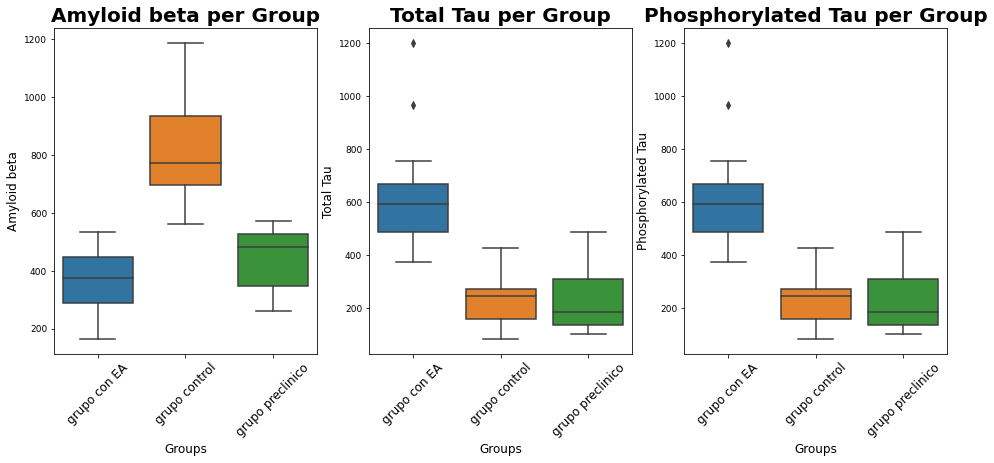

In [7]:
#Setting up the structure of the plots
fig, (ax1,ax2,ax3) = plt.subplots(1,3 ,figsize=(16,6))


#plot boxplot for Amyloid Beta
ax1 = sns.boxplot(x='groups',y="AB42",data=data,ax=ax1)
#Fix legend, titles and font sizes 
ax1.set_ylabel("Amyloid beta", size=12)
ax1.set_xlabel("Groups", size=12)
ax1.set_title('Amyloid beta per Group',fontweight="bold", size=20)
ax1.tick_params(axis = 'x', which = 'major', labelsize = 12,rotation=45)
ax1.tick_params(axis = 'y', which = 'major', labelsize = 9)


#plot boxplot for Total Tau
ax2 = sns.boxplot(x='groups',y="TAU_T",data=data,ax=ax2)
#Fix legend, titles and font sizes 
ax2.set_ylabel("Total Tau", size=12)
ax2.set_xlabel("Groups", size=12)
ax2.set_title('Total Tau per Group',fontweight="bold", size=20)
ax2.tick_params(axis = 'x', which = 'major', labelsize = 12,rotation=45)
ax2.tick_params(axis = 'y', which = 'major', labelsize = 9)


#plot boxplot for Phosphorylated Tau
ax3 = sns.boxplot(x='groups',y="TAU_T",data=data,ax=ax3)
#Fix legend, titles and font sizes 
ax3.set_ylabel("Phosphorylated Tau", size=12)
ax3.set_xlabel("Groups", size=12)
ax3.set_title('Phosphorylated Tau per Group',fontweight="bold", size=20)
ax3.tick_params(axis = 'x', which = 'major', labelsize = 12,rotation=45)
ax3.tick_params(axis = 'y', which = 'major', labelsize = 9)


### 8.3 Variables with a weak relationship
We plot the variables that seemed to have a weak relationship with the predictor i.e Gender and years of education. The motivation was to understand if with a different visualisation we could capture a relationship or if indeed they are not related to the predictor.

#### 8.3.1 Gender
While *MCI* patients have a slightly lower percentage of female patients, there is no strong evidence of a relationship between gender and the group a patient falls into due to Alzheimer's Disease. 

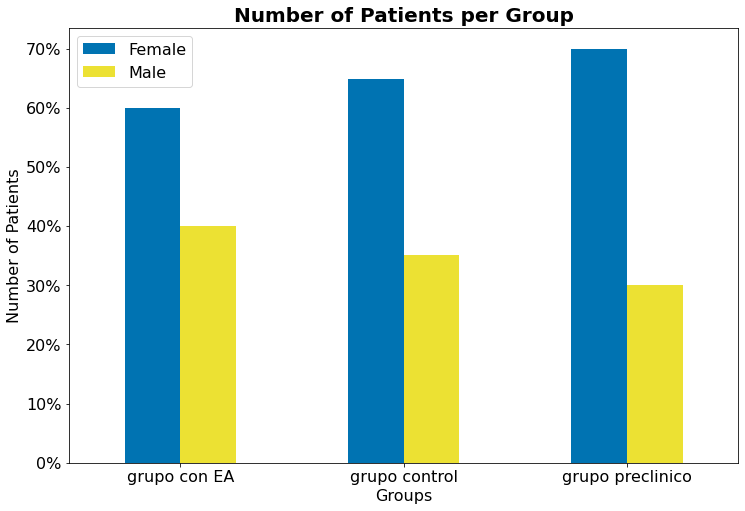

In [8]:
plt.rcParams["figure.figsize"] = (12,8)

import matplotlib.ticker as mtick
ax=data.groupby('groups')['gender']\
    .value_counts(normalize=True)\
    .unstack(level=1)\
    .plot.bar(stacked=False, color=['#0073b2', '#ece133'])
vals = ax.get_yticks()
ax.set_yticklabels(['{:,.0%}'.format(x) for x in vals], size=16)


ax.set_ylabel("Number of Patients", size=16)
ax.set_xlabel("Groups", size=16)
ax.set_title('Number of Patients per Group',fontweight="bold", size=20)
ax.legend(["Female", "Male"],prop={'size': 16});
ax.tick_params(axis = 'x', which = 'major', labelsize = 16,rotation=0)


#### 8.3.2 Education
There seems to be a relationship between education and the patient group, with the healthy patients in the *Control* group having the highest median age, followed by the *Preclinical* patients and finally the *AD* group of Alzheimer's patients having the lowest median age. This trend has also been documented in many research papers, concluding that people with a lower level of education are more inclined to develop Alzheimer's disease.


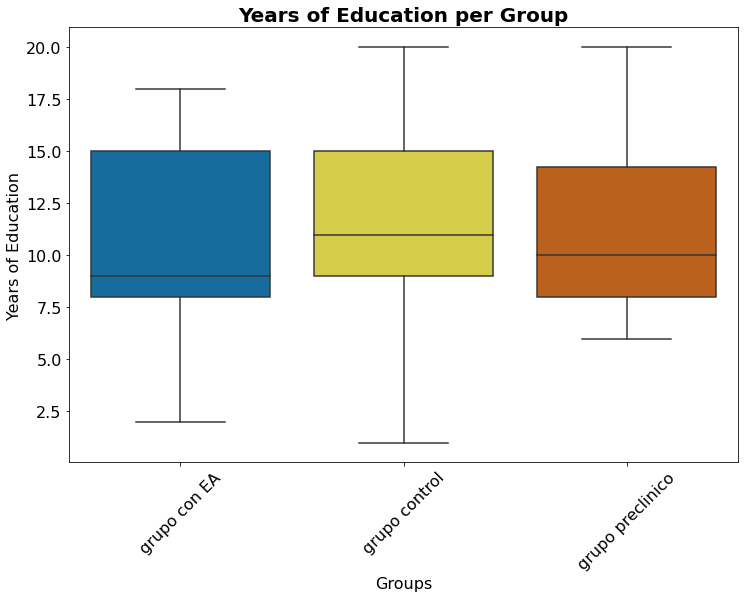

In [9]:
#Define custom colors
my_colors = ["#0073b2", "#ece133", 
             "#d45e03", "#009f73"]
  
# add color array to set_palette
# function of seaborn
sns.set_palette( my_colors )
ax = sns.boxplot(x='groups',y="education",data=data)


ax.set_ylabel("Years of Education", size=16)
ax.set_xlabel("Groups", size=16)
ax.set_title('Years of Education per Group',fontweight="bold", size=20)
ax.tick_params(axis = 'x', which = 'major', labelsize = 16,rotation=45)
ax.tick_params(axis = 'y', which = 'major', labelsize = 16)



### 8.3 Tapping Variables
Considering the tapping variables are what we are trying to understand if they have a relationship with the *groups* variable and thus an be used to classify the group an individual should be assigned to, we attend to understand it's relationship with the biomarkers variables and the groups. 

We also saw that *Amyloid Beta* is a key biomarker at distinguishing between the groups *Control* and *Preclinical* and since the classification of these two groups is a key objective, we want to understand its relationship with the tapping features. 

To achieve this we do two types of graphs
1) Scatterplot - Amyloid Beta vs the individual tapping variables with the group as a hue. 
2) Boxplot - Groupings and the individual tapping variable.

We find that both the tapping rate and the tapping variability have a relationship with Amyloid beta, the prior being a positive relationship and the latter a negative relationship. 

The values of the tapping rate and variability differ depending on the group an individual is in, and move in the direction of the alzheimer's disease stages, with *Preclinical* always being the middle value, containing neither the highest or the lowest values. 

#### 8.3.1 Tapping Rate

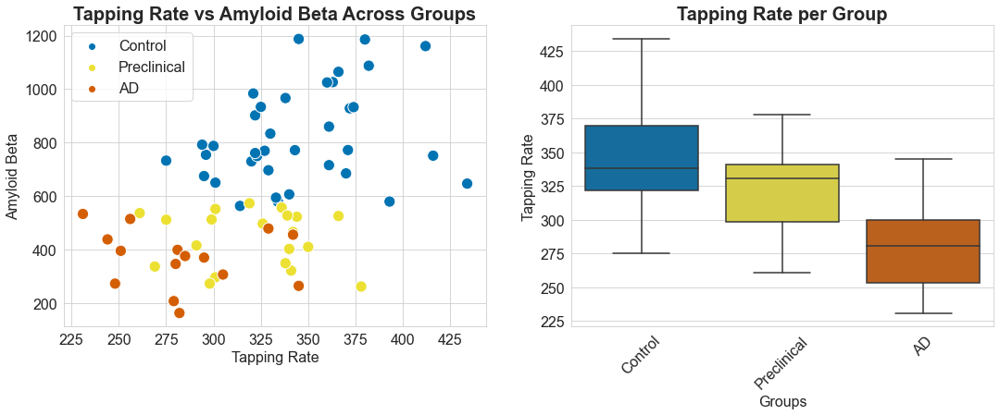

In [80]:
#Setting up the structure of the plots
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(18,6))

#sns.set(rc={'figure.figsize':(12,8.27)})
sns.set_style("whitegrid")

# Set a custom color palette
sns.set_palette(sns.color_palette(my_colors))


#Plot the scatterplot
ax1= sns.scatterplot(
     x='FTT_rate',
     y='AB42',
     data=data,
     hue='groups',
     s=150,
     ax=ax1
)

#Fix legend, titles and font sizes 
ax1.legend(loc='upper left',fontsize=16)


#ax1 = plt.gca()
ax1.set_ylabel("Amyloid Beta", size=16)
ax1.set_xlabel("Tapping Rate", size=16)
ax1.set_title('Tapping Rate vs Amyloid Beta Across Groups', fontweight="bold", size=20)
ax1.tick_params(axis = 'x', which = 'major', labelsize = 16)
ax1.tick_params(axis = 'y', which = 'major', labelsize = 16)


#sns.set_palette( my_colors )
#plot boxplot
ax2 = sns.boxplot(x='groups',y="FTT_rate",data=data,ax=ax2)

#Fix legend, titles and font sizes 
ax2.set_ylabel("Tapping Rate", size=16)
ax2.set_xlabel("Groups", size=16)
ax2.set_title('Tapping Rate per Group',fontweight="bold", size=20)
ax2.tick_params(axis = 'x', which = 'major', labelsize = 16,rotation=45)
ax2.tick_params(axis = 'y', which = 'major', labelsize = 16)



 
#data=data[["gender","education","groups","GDS","ApoE4","AB42","TAU_T","P_TAU","FTT_rate","FTT_variability_total_Log10","AL","AT","RD","RDT","BNT","ANIMALES","VOSP_NUM","TMT_A","TMT_B","STROOP_LECT","STROOP_COLOR","STROOP_INT","SDMT","HIPERTENSIÓN","DIABETES","IMC","activ_ocio_cogn","activ_ocio_soc","activ_ocio_fisica","INFARTO_MIOCARDIO","ACCIDENTE_VASCULAR_CEREBRAL"]


#### 8.3.2 Tapping Variability

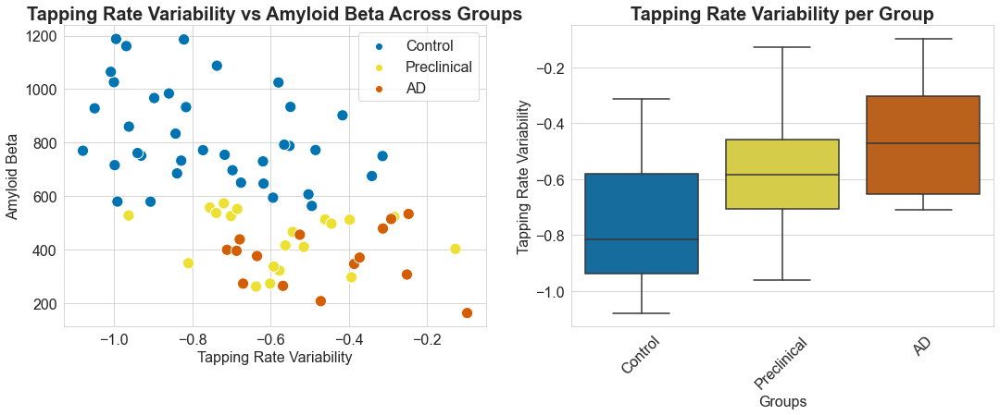

In [81]:
#Setting up the structure of the plots
fig, (ax1,ax2) = plt.subplots(1,2, figsize=(18,6))

#sns.set(rc={'figure.figsize':(12,8.27)})
sns.set_style("whitegrid")

# Set a custom color palette
sns.set_palette(sns.color_palette(my_colors))


#Plot the scatterplot
ax1= sns.scatterplot(
     x='FTT_variability_total_Log10',
     y='AB42',
     data=data,
     hue='groups',
     s=150,
     ax=ax1
)

#Fix legend, titles and font sizes 
ax1.legend(loc='upper right',fontsize=16)


#ax1 = plt.gca()
ax1.set_ylabel("Amyloid Beta", size=16)
ax1.set_xlabel("Tapping Rate Variability", size=16)
ax1.set_title('Tapping Rate Variability vs Amyloid Beta Across Groups', fontweight="bold", size=20)
ax1.tick_params(axis = 'x', which = 'major', labelsize = 16)
ax1.tick_params(axis = 'y', which = 'major', labelsize = 16)


#sns.set_palette( my_colors )
#plot boxplot
ax2 = sns.boxplot(x='groups',y="FTT_variability_total_Log10",data=data,ax=ax2)

#Fix legend, titles and font sizes 
ax2.set_ylabel("Tapping Rate Variability", size=16)
ax2.set_xlabel("Groups", size=16)
ax2.set_title('Tapping Rate Variability per Group',fontweight="bold", size=20)
ax2.tick_params(axis = 'x', which = 'major', labelsize = 16,rotation=45)
ax2.tick_params(axis = 'y', which = 'major', labelsize = 16)

